Setup libraries

In [58]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
# from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray
import matplotlib.pyplot as plt


Define catalogue

In [59]:
catalogue = "https://earth-search.aws.element84.com/v1"
client = Client.open(catalogue)

In [60]:
min_lat = -18.155295
min_lon = 177.403231
max_lat = -18.131273065348047 
max_lon = 177.43468904098003
bbox = [min_lon, min_lat, max_lon, max_lat]

In [61]:
# focus on dry season
datetime="2024-03/2024-10"

In [62]:
dask_client = DaskClient(n_workers=4, threads_per_worker=16, memory_limit='16GB')

#configure_s3_access(cloud_defaults=True, requester_pays=True)

/srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 41245 instead
  warnings.warn(


In [63]:
# Define training data

gdf = gpd.read_file("tdata_yanuca_16012024.geojson")
gdf = gdf.to_crs("EPSG:4326")
gdf.explore(column="lulc", legend=True)


In [64]:
print(len(gdf))

1500


In [65]:
# Search through catalogue for relevant data
items = client.search(
    collections=["sentinel-2-c1-l2a"],
    bbox=bbox,
    datetime=datetime,
    query={"eo:cloud_cover":{"lt": 50}},
).item_collection()

print(f"Found {len(items)} items")


Found 55 items


In [66]:
items

In [67]:
# data = utils.load_data
data = load_data(items, bbox)

In [68]:
# Mask out clouds and scale values
# Sentinel-2 cloud mask flags (1: defective, 3: shadow, 9: high confidence cloud, 10: thin cirrus)
mask_flags = [1, 3, 9, 10]

# Apply the cloud mask (invert the mask to keep non-cloud values)
cloud_mask = ~data.scl.isin(mask_flags)
masked = data.where(cloud_mask)

# Apply scaling and clip values from 0 to 1
scaled = (masked.where(masked != 0) * 0.0001).clip(0, 1)

In [69]:
# Create a median composite, which should get rid of most of the remaining clouds
# Note that this will take a few minutes to complete

median = scaled.median("time").compute()
median

/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(
/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


<xarray.Dataset> Size: 5MB
Dimensions:      (y: 268, x: 335)
Coordinates:
  * y            (y) float64 2kB 7.995e+06 7.995e+06 ... 7.993e+06 7.993e+06
  * x            (x) float64 3kB 5.426e+05 5.427e+05 ... 5.46e+05 5.46e+05
    spatial_ref  int32 4B 32760
Data variables: (12/13)
    red          (y, x) float32 359kB 0.1314 0.1322 0.1313 ... 0.1642 0.1665
    green        (y, x) float32 359kB 0.1296 0.1293 0.1307 ... 0.2015 0.2105
    blue         (y, x) float32 359kB 0.1249 0.1229 0.1244 ... 0.1745 0.1812
    nir08        (y, x) float32 359kB 0.1457 0.1457 0.144 ... 0.1149 0.1156
    swir16       (y, x) float32 359kB 0.1139 0.1139 0.1163 ... 0.1153 0.1125
    scl          (y, x) float32 359kB 0.00065 0.00065 0.00065 ... 0.0006 0.0006
    ...           ...
    nir09        (y, x) float32 359kB 0.142 0.142 0.142 ... 0.1099 0.1099 0.1094
    cloud        (y, x) float32 359kB 0.0065 0.0065 0.0065 ... 0.0049 0.0065
    rededge1     (y, x) float32 359kB 0.1423 0.1423 0.1431 ... 0.1729 0.1731
    rededge3     (y, x) float32 359kB 0.1447 0.1447 0.146 ... 0.1189 0.1203
    rededge2     (y, x) float32 359kB 0.137 0.137 0.1412 ... 0.1164 0.1162
    nir          (y, x) float32 359kB 0.1413 0.1431 0.1437 ... 0.1169 0.1154

In [70]:
median_image = median.assign_coords(band=["red", "green", "blue", "nir", "swir1", "swir2", "coastal", "rededge1", "rededge2", "rededge3",])

In [71]:
stacked = median.to_array(dim="band")
stacked.rio.to_raster("median_dataset.tif")

In [72]:
# First transform the training points to the same CRS as the data
training = gdf.to_crs(median.odc.geobox.crs)

# Next get the X and Y values out of the point geometries
training_da = training.assign(x=training.geometry.x, y=training.geometry.y).to_xarray()

# Now we can use the x and y values (lon, lat) to extract values from the median composite
training_values = (
    median.sel(training_da[["x", "y"]], method="nearest").squeeze().compute().to_pandas()
)



In [73]:
# Join the training data with the extracted values and remove unnecessary columns
training_array = pd.concat([training["randomforest"], training_values], axis=1)
training_array = training_array.drop(
    columns=[
        "y",
        "x",
        "spatial_ref",
    ]
)

# Drop rows where there was no data available
training_array = training_array.dropna()

# Preview our resulting training array
training_array.head()

,randomforest,red,green,blue,nir08,swir16,scl,coastal,nir09,cloud,rededge1,rededge3,rededge2,nir
0,6,0.2252,0.25660,0.22440,0.15810,0.1485,0.0005,0.15790,0.15050,0.00650,0.1879,0.1655,0.16530,0.17540
1,5,0.1245,0.15320,0.14050,0.11100,0.1084,0.0006,0.13370,0.10740,0.00635,0.1360,0.1138,0.11280,0.10940
2,5,0.1290,0.15390,0.14050,0.11075,0.1080,0.0006,0.13335,0.10650,0.00650,0.1322,0.1106,0.11090,0.11195
3,5,0.1240,0.14615,0.13625,0.10835,0.1083,0.0006,0.13235,0.10555,0.00650,0.1316,0.1121,0.11045,0.10930
4,5,0.1215,0.14340,0.13370,0.11075,0.1080,0.0006,0.13335,0.10650,0.00650,0.1322,0.1106,0.11090,0.10880


In [74]:
# The classes are the first column
classes = np.array(training_array)[:, 0]

# The observation data is everything after the first column
observations = np.array(training_array)[:, 1:]

# Create a model...
classifier = RandomForestClassifier()

# ...and fit it to the data
model = classifier.fit(observations, classes)

In [75]:
# Convert to a stacked array of observations
stacked_arrays = median.to_array().stack(dims=["y", "x"]).transpose()

# Predict the classes
predicted = model.predict(stacked_arrays)

# Reshape back to the original 2D array
array = predicted.reshape(len(median.y), len(median.x))

# Convert to an xarray again, because it's easier to work with
predicted_da = xr.DataArray(
    array, coords={"y": median.y, "x": median.x}, dims=["y", "x"]
)

In [76]:
print(predicted_da.dtype)  # Check the dtype of your DataArray
predicted_da = predicted_da.astype('float32')  # Convert to float32

float64


In [77]:

# Check for NaN values
if np.isnan(median).any():
    print("NaN values found in the data")
    # Handle NaN values, e.g. by filling them
    median = median.fillna(0)  # Replace NaN with 0 or appropriate value

NaN values found in the data


In [78]:
# Check if CRS is set, if not set it
if not median.rio.crs:
    median = median.rio.write_crs("EPSG:4326")  # Set to appropriate CRS

In [79]:
# Put it all on a single interactive map
# center = [np.mean([min_lat[0], max_lat[0]]), np.mean([min_lat[1], max_lat[1]])]
# m = folium.Map(location=center, zoom_start=11)

center = [(min_lat + max_lat) / 2, (min_lon + max_lon) / 2]  # Assuming min_lon and max_lon are defined
m = folium.Map(location=center, zoom_start=13)



# RGB for the median
median.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=0.3).odc.add_to(m, name="Median Composite")


# Categorical for the predicted classes and for the training data
predicted_da.odc.add_to(m, name="Predicted")
gdf.explore(m=m, column="randomforest", legend=True, name="Training Data")

# Layer control
folium.LayerControl().add_to(m)

m

In [80]:
predicted_da.odc.write_cog("predicted_randomforest_model_1.tif", overwrite=True)

PosixPath('predicted_randomforest_model_1.tif')

## Accuracy assessment

In [89]:
gdf

,lulc,class_id,randomforest,geometry
1,seagrass,7,5,POINT (177.41866 -18.1398)
2,seagrass,7,5,POINT (177.41876 -18.13963)
3,seagrass,7,5,POINT (177.4187 -18.13955)
4,seagrass,7,5,POINT (177.41862 -18.13973)
5,seagrass,7,5,POINT (177.41859 -18.13974)
...,...,...,...,...
1495,deeps,2,2,POINT (177.41079 -18.15236)
1496,deeps,2,2,POINT (177.40905 -18.15174)
1497,deeps,2,2,POINT (177.4085 -18.14941)
1498,deeps,2,2,POINT (177.40905 -18.14849)


In [117]:
# Get unique values from the column
unique_values = gdf['lulc'].unique()

# Print each unique value
for value in unique_values:
    print(value)

seagrass
coral
sand
deeps
seaweed
sediment
rock
land


In [81]:
from sklearn.model_selection import train_test_split

In [92]:
print(len(training_array), len(gdf))  # Check the lengths of both arrays

1499 1499


In [83]:
# If needed, trim one array to match the other's length
gdf = gdf[1:len(gdf)]

### Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)   

Where:  
X contains the features (input variables) of your dataset (the independent variables / attributes used as predictors. The columns of the dataset including the bands etc...)   
y contains the labels (target variable).  (the target - the randomforest column / class column that states what the land cover type is. This is the target / final objective of the classification)

In this case:   
X = training_array   
y = gdf.randomforest


In [93]:
X_train, X_test, y_train, y_test = train_test_split(training_array, gdf.randomforest, test_size=0.2, random_state=42)

In [94]:
y_train = y_train.astype(int)

In [95]:
# Train your model
model.fit(X_train, y_train)

RandomForestClassifier()

In [96]:
# Make predictions
y_pred = model.predict(X_test)

<Figure size 1200x1000 with 0 Axes>

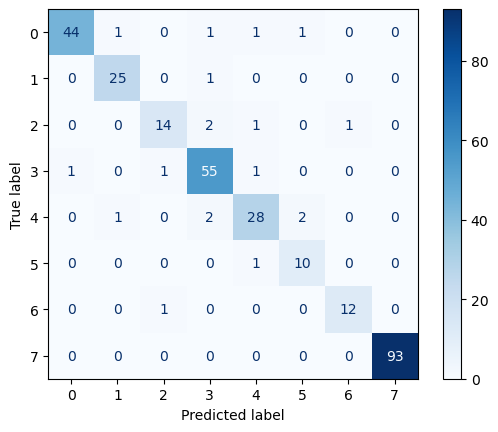

In [104]:

# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
plt.figure(figsize=(12, 10))  # Adjust width and height for larger plot
cm_display.plot(cmap='Blues')

In [105]:
cm

array([[44,  1,  0,  1,  1,  1,  0,  0],
       [ 0, 25,  0,  1,  0,  0,  0,  0],
       [ 0,  0, 14,  2,  1,  0,  1,  0],
       [ 1,  0,  1, 55,  1,  0,  0,  0],
       [ 0,  1,  0,  2, 28,  2,  0,  0],
       [ 0,  0,  0,  0,  1, 10,  0,  0],
       [ 0,  0,  1,  0,  0,  0, 12,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 93]])

In [106]:
from sklearn.metrics import accuracy_score

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.4f}')

Accuracy: 0.9367


In [114]:
gdf

,lulc,class_id,randomforest,geometry
1,seagrass,7,5,POINT (177.41866 -18.1398)
2,seagrass,7,5,POINT (177.41876 -18.13963)
3,seagrass,7,5,POINT (177.4187 -18.13955)
4,seagrass,7,5,POINT (177.41862 -18.13973)
5,seagrass,7,5,POINT (177.41859 -18.13974)
...,...,...,...,...
1495,deeps,2,2,POINT (177.41079 -18.15236)
1496,deeps,2,2,POINT (177.40905 -18.15174)
1497,deeps,2,2,POINT (177.4085 -18.14941)
1498,deeps,2,2,POINT (177.40905 -18.14849)


In [121]:
from sklearn.metrics import classification_report

# report = classification_report(true_labels, predicted_labels, target_names=class_labels)
# print(report)

report = classification_report(y_test, y_pred, target_names=['seagrass', 'coral', 'sand', 'deeps', 'seaweed', 'sediment', 'rock', 'land'])
print(report)

              precision    recall  f1-score   support

    seagrass       0.98      0.92      0.95        48
       coral       0.93      0.96      0.94        26
        sand       0.88      0.78      0.82        18
       deeps       0.90      0.95      0.92        58
     seaweed       0.88      0.85      0.86        33
    sediment       0.77      0.91      0.83        11
        rock       0.92      0.92      0.92        13
        land       1.00      1.00      1.00        93

    accuracy                           0.94       300
   macro avg       0.91      0.91      0.91       300
weighted avg       0.94      0.94      0.94       300



In [108]:
print("Unique labels in y_test:", np.unique(y_test))
print("Unique labels in y_pred:", np.unique(y_pred))

Unique labels in y_test: [1 2 3 4 5 6 7 8]
Unique labels in y_pred: [1 2 3 4 5 6 7 8]


In [109]:
print("Length of y_test:", len(y_test))
print("Length of y_pred:", len(y_pred))

Length of y_test: 300
Length of y_pred: 300
